# Installing libraries

In [178]:
# Import general utilities
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.widgets import Slider, Button, RadioButtons

from tqdm import tqdm
import random
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import cv2


# Import image libraries
import os,time,subprocess,glob
from PIL import Image
import skimage
from skimage import io
from skimage.transform import rotate
from skimage.data import cells3d
from skimage.filters import threshold_otsu
from scipy.ndimage import distance_transform_edt,convolve
import os, re

# Import TDA utilities
import cripser as cr
import tcripser as tcr
import persim
import PersistenceImages.persistence_images as pimg
from persim.landscapes import PersLandscapeExact
from persim.landscapes import plot_landscape_simple
from persim.landscapes import PersistenceLandscaper
from persim import plot_diagrams
from persim import PersImage


# Import Scikit-Learn tools
from sklearn.decomposition import PCA
from sklearn import svm
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Machine learning
from sklearn.ensemble import RandomForestClassifier


import warnings

warnings.filterwarnings("ignore", category=UserWarning, message=r"Your `PyDataset` class should call `super().__init__\(\*\*kwargs\)`")

In [179]:
# binary thresholding and distance transform on an image
def dt(img, radius=None, signed=False):
  if radius is not None:
    from skimage.filters import rank
    from skimage.morphology import disk
    bw_img = img >= rank.otsu(img, disk(radius))
  else:
    bw_img = img >= threshold_otsu(img)

  dt_img = distance_transform_edt(bw_img)
  if signed:
    dt_img -= distance_transform_edt(~bw_img)

  return dt_img

def gaussian(h, sigma):
  x = np.arange(-h[0], h[0], 1)
  y = np.arange(-h[1], h[1], 1)
  z = np.arange(-h[2], h[2], 1)
  xx, yy, zz = np.meshgrid(x, y, z)
  return np.exp(-(xx**2 + yy**2 + zz**2) / (2 * sigma**2)).astype(np.float32)

# heatmap of cycles with specified birth-death properties.
def heat_map(img, pd, h=3, sigma=1, min_life=10, max_life=255, min_birth=0, max_birth=255, dimension=0, life_weighted=True, location='birth'):
  if len(img.shape) == 2:
    mx, my = img.shape
    mz = 1
    kernel = gaussian([h, h, 1], sigma)
  else:
    mx, my, mz = img.shape
    kernel = gaussian([h, h, h], sigma)

  selected_cycle = np.zeros((mx, my, mz))
  ppd = pd[pd[:, 0] == dimension]
  ppd = ppd[(min_life < ppd[:, 2] - ppd[:, 1]) & (ppd[:, 2] - ppd[:, 1] < max_life)]
  ppd = ppd[(min_birth < ppd[:, 1]) & (ppd[:, 1] < max_birth)]

  for c in ppd:
    x, y, z = (int(c[3]), int(c[4]), int(c[5])) if location == 'birth' else (int(c[6]), int(c[7]), int(c[8]))
    w = c[2] - c[1] if life_weighted else 1
    selected_cycle[x, y, z] += w

  cycle_conv = convolve(selected_cycle, kernel)
  return np.squeeze(cycle_conv)

def plot_persistent_diagram(diagram, ax, title="Persistent Diagram"):
    ax.scatter(diagram[:, 1], diagram[:, 2], c='red', edgecolor='black')
    ax.plot([0, max(diagram[:, 2])], [0, max(diagram[:, 2])], 'k--')  # Diagonal line
    ax.set_title(title)
    ax.set_xlabel("Birth")
    ax.set_ylabel("Death")

# Import the datafile

In [180]:
df = pd.read_csv("D:/butterflies/Training_set.csv")

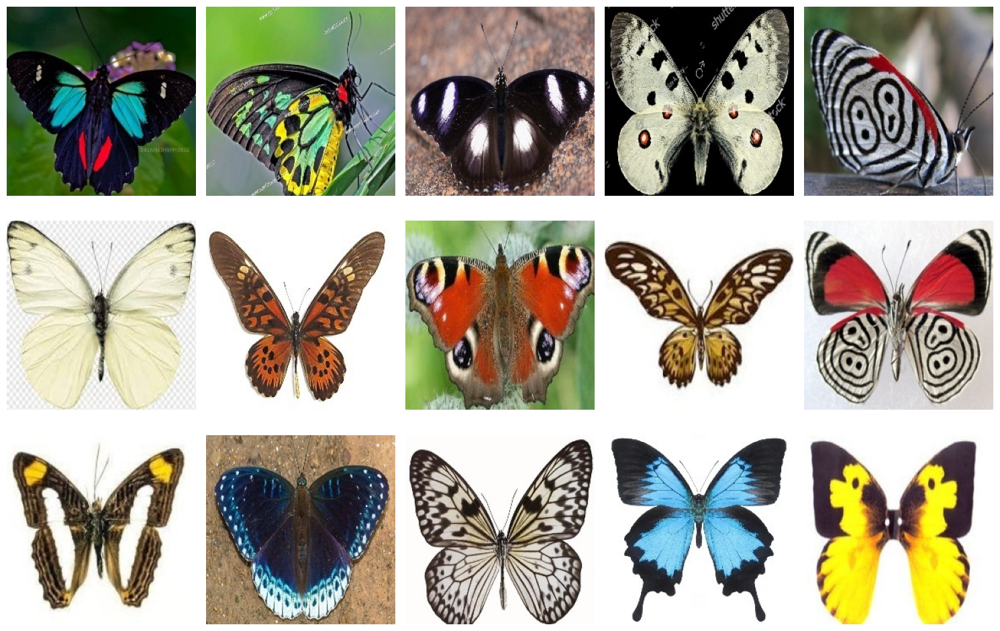

In [182]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# List of image paths
butterflies = [
    "D:\\butterflies\\train\\Image_7.jpg",
    "D:\\butterflies\\train\\Image_32.jpg",
    "D:\\butterflies\\train\\Image_38.jpg",
    "D:\\butterflies\\train\\Image_86.jpg",
    "D:\\butterflies\\train\\Image_123.jpg",
    "D:\\butterflies\\train\\Image_422.jpg",
    "D:\\butterflies\\train\\Image_438.jpg",
    "D:\\butterflies\\train\\Image_638.jpg",
    "D:\\butterflies\\train\\Image_1013.jpg",
    "D:\\butterflies\\train\\Image_1129.jpg",
    "D:\\butterflies\\train\\Image_1117.jpg",
    "D:\\butterflies\\train\\Image_654.jpg",
    "D:\\butterflies\\train\\Image_76.jpg",
    "D:\\butterflies\\train\\Image_219.jpg",
    "D:\\butterflies\\train\\Image_763.jpg"
]

butterflies_similar = ["D:\\butterflies\\train\\Image_2083.jpg",
                       "D:\\butterflies\\train\\Image_2107.jpg",
                       "D:\\butterflies\\train\\Image_3232.jpg",
                       "D:\\butterflies\\train\\Image_3311.jpg",
                       "D:\\butterflies\\train\\Image_3507.jpg",
                       "D:\\butterflies\\train\\Image_3629.jpg",
                       "D:\\butterflies\\train\\Image_3681.jpg",
                       "D:\\butterflies\\train\\Image_3703.jpg"]

# Number of rows and columns for display
rows = 3
cols = 5  # Since you have 15 images, 5 images per row makes sense

# Create a figure and adjust layout
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
axes = axes.flatten()  # Flatten the axes to make it easier to iterate through

# Loop through each image and display it
for i, ax in enumerate(axes):
    if i < len(butterflies):  # Check if the index is within the image list
        img = mpimg.imread(butterflies[i])  # Read the image
        ax.imshow(img)  # Display the image
        ax.axis('off')  # Hide the axis

plt.tight_layout()  # Adjust layout so images don't overlap
plt.show()


# Persistent Image and Landscape on one Image

## Persistent Landscape

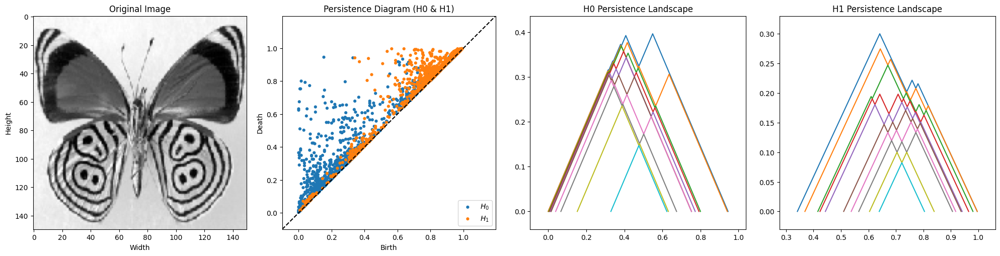

In [175]:
image_path = "D:\\butterflies\\train\\Image_1129.jpg"

img = load_img(image_path, target_size=(150, 150), color_mode='grayscale')
img_array = img_to_array(img).squeeze() / 255.0  # Normalize

pd_diagram = cr.computePH(img_array, maxdim=1)

pd_diagram = [pd_diagram[pd_diagram[:, 0] == i, 1:3] for i in range(2)]

pd_diagram = [
    pd_diagram[i][pd_diagram[i][:, 1] < 1]  # Keep only features where death < 1, i.e. not infinite
    for i in range(2)
]

# Plot original image, persistence diagram, and persistent images
fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # 4 subplots now!

# Display original grayscale image
axs[0].imshow(img, cmap="gray")
axs[0].set_title("Original Image")
axs[0].set_xlabel("Width")
axs[0].set_ylabel("Height")

persim.plot_diagrams(pd_diagram, ax=axs[1])
axs[1].set_title("Persistence Diagram (H0 & H1)")
axs[1].set_xlabel("Birth")
axs[1].set_ylabel("Death")

for d in range(2):  # H0 and H1
    birth_death = pd_diagram[d]
    persistence = birth_death[:, 1] - birth_death[:, 0]  # death - birth

    sorted_indices = np.argsort(persistence)[::-1]  # Sort in descending order
    top_10_indices = sorted_indices[:10]  # Get the indices of the top 10 most persistent features
        
        # Filter the top 10 persistent features
    top_10_persistent_features = birth_death[top_10_indices]

        # Compute the persistence landscape for the filtered features
    landscape = PersLandscapeExact([top_10_persistent_features])  # Compute landscape for filtered features

    # Plot the persistence landscape on the respective axis
    _ = plot_landscape_simple(landscape, title=f"H{d} Persistence Landscape", ax=axs[d+2])  # Suppress output

    if axs[d+2].get_legend() is not None:
        axs[d+2].get_legend().remove() 

plt.tight_layout()
plt.show()

## Persistent Image

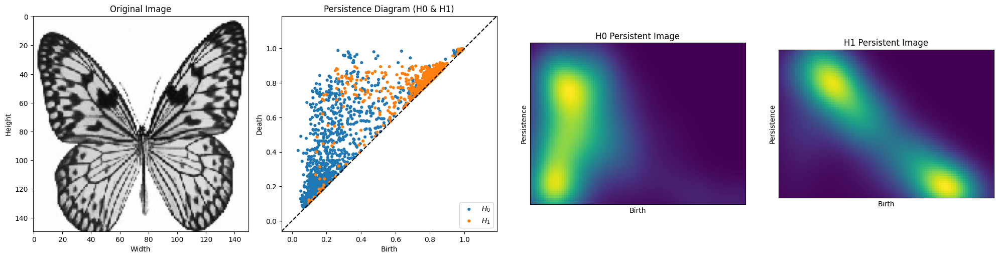

In [154]:
from persim import PersImage
from persim import PersistenceImager

pim = pimg.PersistenceImager(birth_range=(-max_life, max_life),
                             pers_range=(0, max_life),
                             pixel_size=pixel_size)

# Image path
image_path = "D:\\butterflies\\train\\Image_76.jpg"

# Load and preprocess image using PIL
img = load_img(image_path, target_size=(150, 150), color_mode='grayscale')
img_array = img_to_array(img).squeeze() / 255.0  # Normalize

pd_diagram = cr.computePH(img_array, maxdim=1)

pd_diagram = [pd_diagram[pd_diagram[:, 0] == i, 1:3] for i in range(2)]

pd_diagram = [
    pd_diagram[i][pd_diagram[i][:, 1] < 1]  # Keep only features where death == 0
    for i in range(2)
]

fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # 4 subplots now!

# Display original grayscale image
axs[0].imshow(img, cmap="gray")
axs[0].set_title("Original Image")
axs[0].set_xlabel("Width")
axs[0].set_ylabel("Height")

persim.plot_diagrams(pd_diagram, ax=axs[1])
axs[1].set_title("Persistence Diagram (H0 & H1)")
axs[1].set_xlabel("Birth")
axs[1].set_ylabel("Death")


# For H0 (dimension 0)
pimgr = PersistenceImager(pixel_size=0.01)
pimgr.fit(pd_diagram[0])
pimgr.kernel_params = {'sigma': .005}
pimgr.plot_image(pimgr.transform(pd_diagram[0]), ax=axs[2])
axs[2].set_title("H0 Persistent Image")
axs[2].set_xlabel("Birth")
axs[2].set_ylabel("Persistence")

# For H1 (dimension 1)
pimgr = PersistenceImager(pixel_size=0.01)
pimgr.fit(pd_diagram[1])
pimgr.kernel_params = {'sigma': .005}
pimgr.plot_image(pimgr.transform(pd_diagram[1]), ax=axs[3])
axs[3].set_title("H1 Persistent Image")
axs[3].set_xlabel("Birth")
axs[3].set_ylabel("Persistence")

plt.tight_layout()
plt.show()

## Persistent statistics

In [41]:
image_path = "D:\\butterflies\\train\\Image_422.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
target_size = (128, 128)
img_resized = cv2.resize(img, target_size)
pd_diagram = cr.computePH(img_array, maxdim=1)

pd_diagram = [pd_diagram[pd_diagram[:, 0] == i, 1:3] for i in range(2)]

# Function to compute persistence statistics
def compute_persistent_statistics(pd_diagram):
    statistics = {}
    
    # Iterate over the dimensions (H0, H1, etc.)
    for dim, diagram in enumerate(pd_diagram):
        # Extract birth and death values for the current dimension
        birth_death = diagram
        birth = birth_death[:, 0]
        death = birth_death[:, 1]
        
        # Compute persistence values (death - birth)
        persistence = death - birth
        
        # Calculate statistics for the current dimension
        statistics[dim] = {
            'mean_birth': np.mean(birth),
            'mean_death': np.mean(death),
            'mean_persistence': np.mean(persistence),
            'median_birth': np.median(birth),
            'median_death': np.median(death),
            'median_persistence': np.median(persistence),
            'std_birth': np.std(birth),
            'std_death': np.std(death),
            'std_persistence': np.std(persistence),
            'max_persistence': np.max(persistence),
            'min_persistence': np.min(persistence),
            'num_features': len(birth)  # Number of features in this dimension
        }
        
    return statistics

# Compute persistent statistics for the diagram
persistent_statistics = compute_persistent_statistics(pd_diagram)

# Print the computed statistics
for dim, stats in persistent_statistics.items():
    print(f"Dimension {dim}:")
    for stat_name, value in stats.items():
        print(f"  {stat_name}: {value}")


Dimension 0:
  mean_birth: 0.3807070016380804
  mean_death: 9.818094674289e+304
  mean_persistence: 9.818094674289e+304
  median_birth: 0.20000000298023224
  median_death: 0.364705890417099
  median_persistence: 0.0313725471496582
  std_birth: 0.32942697645076185
  std_death: inf
  std_persistence: inf
  max_persistence: 1.7976931348623157e+308
  min_persistence: 0.003921568393707275
  num_features: 1831
Dimension 1:
  mean_birth: 0.7944772322459303
  mean_death: 0.849613611866638
  mean_persistence: 0.05513637962070762
  median_birth: 0.8352941274642944
  median_death: 0.8588235378265381
  median_persistence: 0.011764705181121826
  std_birth: 0.19957423233472774
  std_death: 0.14681574234946862
  std_persistence: 0.10960546979549984
  max_persistence: 0.6235294044017792
  min_persistence: 0.003921568393707275
  num_features: 987


C:\Users\user\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


# Persistent Diagrams

In [170]:
all_pd_diagrams = []

# Loop through each image in the list
for image_path in butterflies:
    # Load and preprocess the image
    img = load_img(image_path, target_size=(150, 150), color_mode='grayscale')
    img_array = img_to_array(img).squeeze() / 255.0  # Normalize the image
    
    # Compute the persistence homology for the image
    pd_diagram = cr.computePH(img_array, maxdim=1)  # Assuming `cr.computePH` computes the persistence diagram
    
    # Split the diagram into H0 and H1
    pd_diagram = [pd_diagram[pd_diagram[:, 0] == i, 1:3] for i in range(2)]

    # Filter out the features where death > 1 (i.e., keep features with death <= 1)
    pd_diagram_filtered = [
        pd_diagram[i][pd_diagram[i][:, 1] < 1]  # Keep only features where death < 1
        for i in range(2)
    ]
    
    # Add the filtered persistence diagram for this image to the list
    all_pd_diagrams.append(pd_diagram_filtered)

In [183]:
all_pd_diagrams_similar = []

# Loop through each image in the list
for image_path in butterflies_similar:
    # Load and preprocess the image
    img = load_img(image_path, target_size=(150, 150), color_mode='grayscale')
    img_array = img_to_array(img).squeeze() / 255.0  # Normalize the image
    
    # Compute the persistence homology for the image
    pd_diagram = cr.computePH(img_array, maxdim=1)  # Assuming `cr.computePH` computes the persistence diagram
    
    # Split the diagram into H0 and H1
    pd_diagram = [pd_diagram[pd_diagram[:, 0] == i, 1:3] for i in range(2)]

    # Filter out the features where death > 1 (i.e., keep features with death <= 1)
    pd_diagram_filtered = [
        pd_diagram[i][pd_diagram[i][:, 1] < 1]  # Keep only features where death < 1
        for i in range(2)
    ]
    
    # Add the filtered persistence diagram for this image to the list
    all_pd_diagrams_similar.append(pd_diagram_filtered)

# Persistent landscapes

## Compare different butterlies 

In [172]:
landscapes_h0 = []
landscapes_h1 = []

# Loop over each persistence diagram in the list
for pd_diagram in all_pd_diagrams:
    for d in range(2):  # H0 (0) and H1 (1)
        birth_death = pd_diagram[d]  # Get the birth-death pairs for the current dimension
        persistence = birth_death[:, 1] - birth_death[:, 0]  # Compute persistence (death - birth)
        sorted_indices = np.argsort(persistence)[::-1]  # Sort in descending order
        top_10_indices = sorted_indices[:10]  # Get the indices of the top 10 most persistent features
        
        # Filter the top 10 persistent features
        top_10_persistent_features = birth_death[top_10_indices]

        # Compute the persistence landscape for the filtered features
        landscape = PersLandscapeExact([top_10_persistent_features])  # Compute landscape for filtered features

        if d == 0:
            landscapes_h0.append(landscape)
        else:
            landscapes_h1.append(landscape)


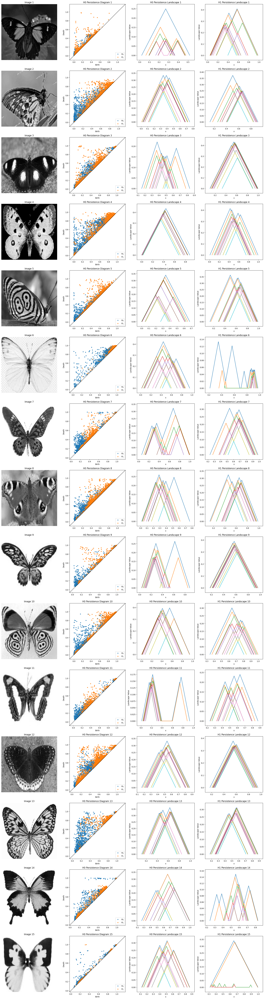

In [173]:
num_images = len(butterflies)

# Create a figure with 4 columns (Image, H0 Diagram, H1 Diagram, Landscapes)
fig, axs = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))

# Loop over each image in the butterflies array
for idx, image_path in enumerate(butterflies):
    # Load the image
    img = load_img(image_path, target_size=(150, 150), color_mode='grayscale')
    img_array = img_to_array(img).squeeze() / 255.0  # Normalize the image

    # Get the persistence diagram for this image
    pd_diagram = all_pd_diagrams[idx]  # Get the persistence diagram for the current image

    # Plot the image in the first column
    axs[idx, 0].imshow(img_array, cmap='gray')
    axs[idx, 0].axis('off')  # Hide axes for the image
    axs[idx, 0].set_title(f"Image {idx + 1}")

    # Plot the persistence diagram for H0 in the second column
    persim.plot_diagrams(pd_diagram, ax=axs[idx, 1])
    axs[idx, 1].set_title(f"H0 Persistence Diagram {idx + 1}")

    # Plot the persistence landscape for H0 in the fourth column
    _ = plot_landscape_simple(landscapes_h0[idx], title=f"H{d} Persistence Landscape", ax=axs[idx, 2])  # Suppress output
    if axs[idx, 2].get_legend() is not None:
        axs[idx, 2].get_legend().remove()         
    axs[idx, 2].set_title(f"H0 Persistence Landscape {idx + 1}")
    axs[idx, 2].set_xlabel("x")
    axs[idx, 2].set_ylabel("Landscape Value")

    # Plot the persistence landscape for H1 in the last column
    _ = plot_landscape_simple(landscapes_h1[idx], title=f"H{d} Persistence Landscape", ax=axs[idx, 3])  # Suppress output
    if axs[idx, 3].get_legend() is not None:
        axs[idx, 3].get_legend().remove()    
    axs[idx, 3].set_title(f"H1 Persistence Landscape {idx + 1}")
    axs[idx, 3].set_xlabel("x")
    axs[idx, 3].set_ylabel("Landscape Value")

# Adjust layout to avoid overlapping subplots
plt.tight_layout()
plt.show()


## Compare similar butterflies

In [184]:
landscapes_h0 = []
landscapes_h1 = []

# Loop over each persistence diagram in the list
for pd_diagram in all_pd_diagrams_similar:
    for d in range(2):  # H0 (0) and H1 (1)
        birth_death = pd_diagram[d]  # Get the birth-death pairs for the current dimension
        persistence = birth_death[:, 1] - birth_death[:, 0]  # Compute persistence (death - birth)
        sorted_indices = np.argsort(persistence)[::-1]  # Sort in descending order
        top_10_indices = sorted_indices[:10]  # Get the indices of the top 10 most persistent features
        
        # Filter the top 10 persistent features
        top_10_persistent_features = birth_death[top_10_indices]

        # Compute the persistence landscape for the filtered features
        landscape = PersLandscapeExact([top_10_persistent_features])  # Compute landscape for filtered features

        if d == 0:
            landscapes_h0.append(landscape)
        else:
            landscapes_h1.append(landscape)

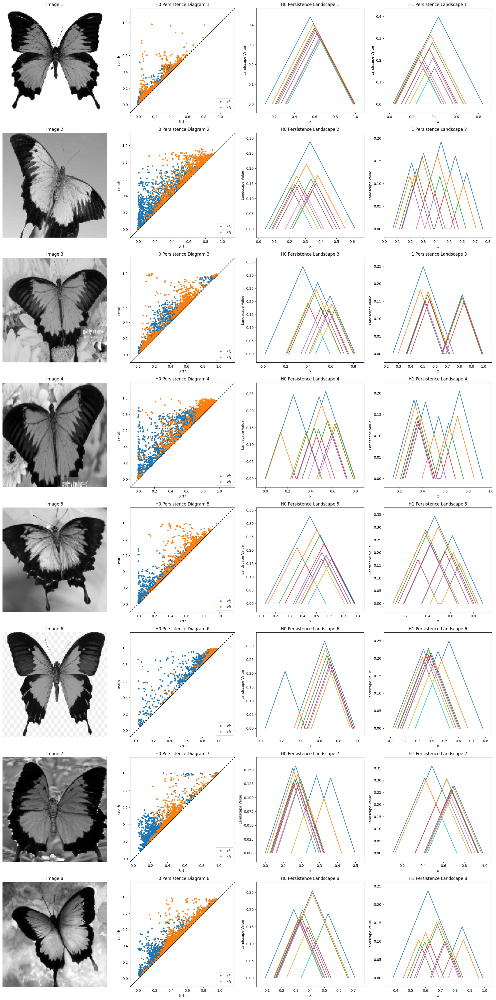

In [185]:
num_images = len(butterflies_similar)

# Create a figure with 4 columns (Image, H0 Diagram, H1 Diagram, Landscapes)
fig, axs = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))

# Loop over each image in the butterflies array
for idx, image_path in enumerate(butterflies_similar):
    # Load the image
    img = load_img(image_path, target_size=(150, 150), color_mode='grayscale')
    img_array = img_to_array(img).squeeze() / 255.0  # Normalize the image

    # Get the persistence diagram for this image
    pd_diagram = all_pd_diagrams[idx]  # Get the persistence diagram for the current image

    # Plot the image in the first column
    axs[idx, 0].imshow(img_array, cmap='gray')
    axs[idx, 0].axis('off')  # Hide axes for the image
    axs[idx, 0].set_title(f"Image {idx + 1}")

    # Plot the persistence diagram for H0 in the second column
    persim.plot_diagrams(pd_diagram, ax=axs[idx, 1])
    axs[idx, 1].set_title(f"H0 Persistence Diagram {idx + 1}")

    # Plot the persistence landscape for H0 in the fourth column
    _ = plot_landscape_simple(landscapes_h0[idx], title=f"H{d} Persistence Landscape", ax=axs[idx, 2])  # Suppress output
    if axs[idx, 2].get_legend() is not None:
        axs[idx, 2].get_legend().remove()         
    axs[idx, 2].set_title(f"H0 Persistence Landscape {idx + 1}")
    axs[idx, 2].set_xlabel("x")
    axs[idx, 2].set_ylabel("Landscape Value")

    # Plot the persistence landscape for H1 in the last column
    _ = plot_landscape_simple(landscapes_h1[idx], title=f"H{d} Persistence Landscape", ax=axs[idx, 3])  # Suppress output
    if axs[idx, 3].get_legend() is not None:
        axs[idx, 3].get_legend().remove()    
    axs[idx, 3].set_title(f"H1 Persistence Landscape {idx + 1}")
    axs[idx, 3].set_xlabel("x")
    axs[idx, 3].set_ylabel("Landscape Value")

# Adjust layout to avoid overlapping subplots
plt.tight_layout()
plt.show()

# Persistent Images

In [187]:
import numpy as np
from persim import PersistenceImager

# Assuming `all_pd_diagrams` contains persistence diagrams for each image
# and `all_pd_diagrams` is a list of [H0, H1] diagrams for each image

# Initialize lists to store the persistent images for H0 and H1
persistent_images_h0 = []
persistent_images_h1 = []

# Loop over each persistence diagram in the list
for pd_diagram in all_pd_diagrams:
    # Initialize the PersistenceImager
    pimgr = PersistenceImager(pixel_size=0.01)
    
    # For H0 (dimension 0), fit the persistence imager and generate the persistent image
    pimgr.fit(pd_diagram[0])  # Fit the imager for H0
    pimgr.kernel_params = {'sigma': 0.005}  # Set the kernel parameters (you can adjust sigma)
    pimgr_transformed_0 = pimgr.transform(pd_diagram[0])  # Generate the persistent image for H0
    
    # For H1 (dimension 1), fit the persistence imager and generate the persistent image
    pimgr.fit(pd_diagram[1])  # Fit the imager for H1
    pimgr_transformed_1 = pimgr.transform(pd_diagram[1])  # Generate the persistent image for H1
    
    # Append the persistent images to the respective lists
    persistent_images_h0.append(pimgr_transformed_0)
    persistent_images_h1.append(pimgr_transformed_1)

# Now persistent_images_h0 and persistent_images_h1 contain the persistent images for H0 and H1 respectively


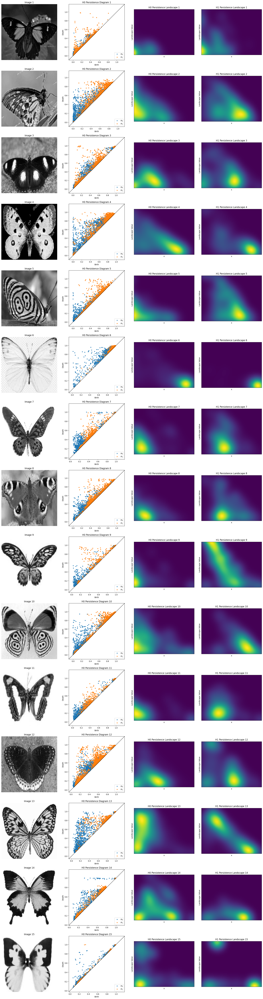

In [186]:
num_images = len(butterflies)

# Create a figure with 4 columns (Image, H0 Diagram, H1 Diagram, Landscapes)
fig, axs = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))

# Loop over each image in the butterflies array
for idx, image_path in enumerate(butterflies):
    # Load the image
    img = load_img(image_path, target_size=(150, 150), color_mode='grayscale')
    img_array = img_to_array(img).squeeze() / 255.0  # Normalize the image

    # Get the persistence diagram for this image
    pd_diagram = all_pd_diagrams[idx]  # Get the persistence diagram for the current image

    # Plot the image in the first column
    axs[idx, 0].imshow(img_array, cmap='gray')
    axs[idx, 0].axis('off')  # Hide axes for the image
    axs[idx, 0].set_title(f"Image {idx + 1}")

    # Plot the persistence diagram for H0 in the second column
    persim.plot_diagrams(pd_diagram, ax=axs[idx, 1])
    axs[idx, 1].set_title(f"H0 Persistence Diagram {idx + 1}")

    pimgr.plot_image(pimgr.transform(pd_diagram[0]), ax=axs[idx, 2])   
    axs[idx, 2].set_title(f"H0 Persistence Landscape {idx + 1}")
    axs[idx, 2].set_xlabel("x")
    axs[idx, 2].set_ylabel("Landscape Value")

    pimgr.plot_image(pimgr.transform(pd_diagram[1]), ax=axs[idx, 3])       
    axs[idx, 3].set_title(f"H1 Persistence Landscape {idx + 1}")
    axs[idx, 3].set_xlabel("x")
    axs[idx, 3].set_ylabel("Landscape Value")

# Adjust layout to avoid overlapping subplots
plt.tight_layout()
plt.show()
